# Image segmentation, Image depth and Garido Apps

### 👽 Import Libraries


In [1]:
#!pip install transformers
#!pip install gradio
#!pip install timm
#!pip install torchvision

- **!pip install transformers:** Installs the Transformers library, which provides state-of-the-art natural language processing models for various tasks such as text classification, translation, summarization, and question answering.

- **!pip install gradio:** Installs Gradio, a Python library that simplifies the creation of interactive web-based user interfaces for machine learning models, allowing users to interact with models via a web browser.

- **!pip install timm:** Installs Timm, a PyTorch library that offers a collection of pre-trained models and a simple interface to use them, primarily focused on computer vision tasks such as image classification and object detection.

- **!pip install torchvision:** is used to install the torchvision library, facilitating computer vision tasks in Python environments.

In [1]:
# to avoid warnings

from transformers.utils import logging

logging.set_verbosity_error()

# Build the image-segmentation pipeline using 🤗 Transformers Library

In [2]:
from transformers import pipeline

**🔍 Segmentation Anything Model (SAM)** is a versatile deep learning architecture 🧠🖼️ designed for pixel-wise segmentation tasks, capable of accurately delineating objects within images for various applications such as object detection, medical imaging, and autonomous driving.
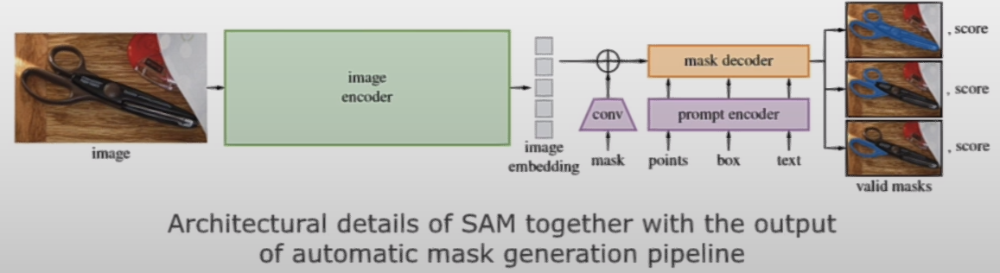


**🔍 SlimSAM(Segment Anything Model):**

SlimSAM, a novel SAM compression method, efficiently reuses pre-trained SAMs through a unified pruning-distillation framework and **employs masking for selective parameter retention**. By integrating an innovative alternate slimming strategy and a label-free pruning criterion, SlimSAM reduces parameter counts to 0.9%, MACs to 0.8%, and requires only 0.1% of the training data compared to the original SAM-H. Extensive experiments demonstrate superior performance with over 10 times less training data usage compared to other SAM compression methods.

**Masking in SlimSAM** selectively retains crucial parameters, enabling efficient compression of pre-trained SAMs without sacrificing performance, by focusing on essential features and discarding redundancies.

👉 model: https://huggingface.co/Zigeng/SlimSAM-uniform-77

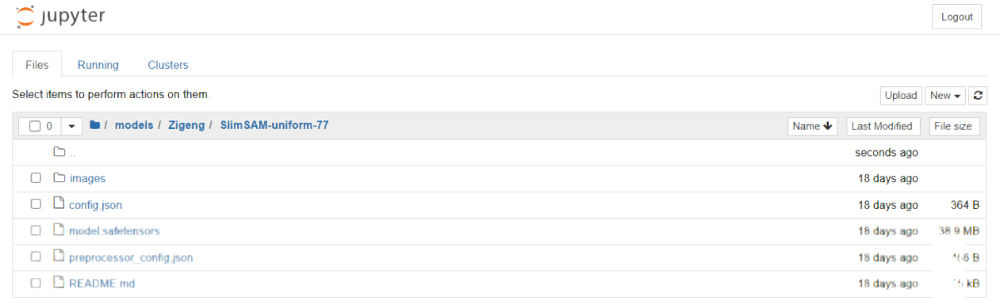

In [7]:
#image masking
sam_pipe = pipeline("mask-generation",
    "./models/Zigeng/SlimSAM-uniform-77")

In [8]:
print(f"pipeline for masking: {sam_pipe} in memory address")

pipeline for masking: <transformers.pipelines.mask_generation.MaskGenerationPipeline object at 0x7f3654ff30d0> in memory address


In [9]:
#Display image
from PIL import Image

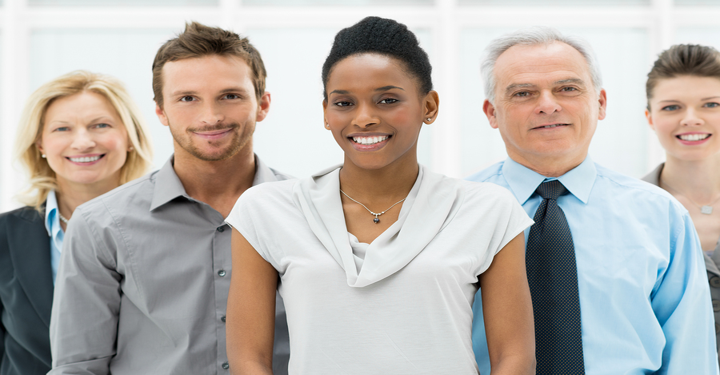

In [10]:
raw_image = Image.open("5-persons.jpg")
raw_image.resize((720, 375))

**💡 Key Notes:**

**`points_per_batch = 32`** in image processing denotes the number of pixel points considered in each batch during model training or inference 🖼️, aiding in efficient computation of gradients and optimization algorithms, thereby enhancing training speed and resource utilization.

**📌 note:** for smaller size in `points_per_batch` is lesser accuracy but less computationally expensive.

In [11]:
output = sam_pipe(raw_image, points_per_batch =32)
print(f"output of pipeline of raw image: \n {output}")

output of pipeline of raw image: 
 {'masks': [array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  Tr

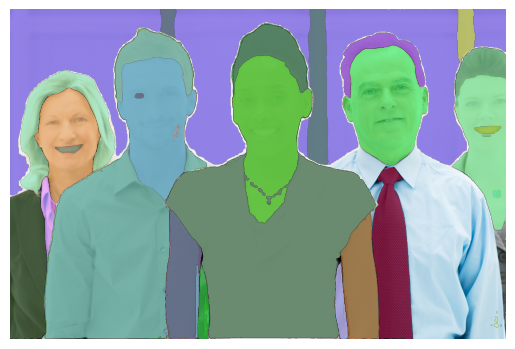

In [12]:
#to show image after segmentation

from helper import show_pipe_masks_on_image

show_pipe_masks_on_image(raw_image, output)

# 🔍 Use SlimSAM(Segment Anything Model) without Pipeline

In [13]:
from transformers import SamModel, SamProcessor

In [14]:
model = SamModel.from_pretrained(
    "./models/Zigeng/SlimSAM-uniform-77")

processor = SamProcessor.from_pretrained(
    "./models/Zigeng/SlimSAM-uniform-77")

In [15]:
print(f"model details: \n {model}")

model details: 
 SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 168, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((168,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=168, out_features=504, bias=True)
          (proj): Linear(in_features=168, out_features=168, bias=True)
        )
        (layer_norm2): LayerNorm((168,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=168, out_features=696, bias=True)
          (lin2): Linear(in_features=696, out_features=168, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(168, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLay


- 🧠 The model variable initializes a SlimSAM model instance loaded from pre-trained weights 🧠🔗 located at "./models/Zigeng/SlimSAM-uniform-77", enabling tasks like inference or fine-tuning.

- 🔗 The processor variable initializes a SamProcessor instance loaded with pre-trained settings 🛠️🔗 located at "./models/Zigeng/SlimSAM-uniform-77", facilitating data preprocessing for compatibility with the SlimSAM model during inference or fine-tuning processes.

- 🛠️ Pretrained settings encompass pre-defined configurations or parameters obtained from training a model 🧠🔗, facilitating effective performance in related tasks with minimal fine-tuning or adjustment.

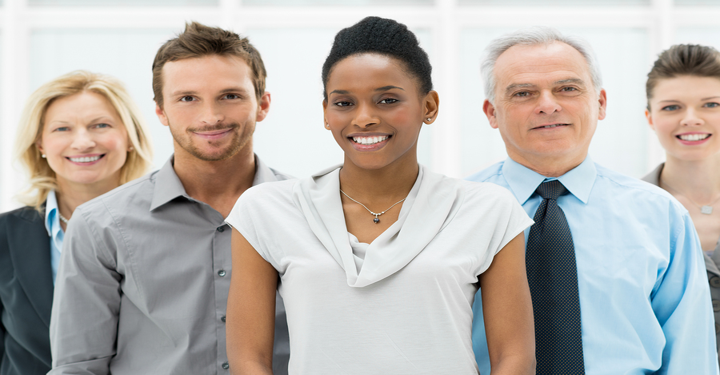

In [16]:
raw_image = Image.open("5-persons.jpg")
raw_image.resize((720, 375))

In [17]:
input_points = [[[750, 300]]]
print(f"input points: {input_points}")


input points: [[[750, 300]]]


**📌 note:** inside the innermost list, we have the coordinates [750, 300], which represents a single point in a two-dimensional space. Here, 750 denotes the x-coordinate, and 300 denotes the y-coordinate.

In [18]:
inputs = processor(raw_image,
                 input_points=input_points,
                 return_tensors="pt")

In [19]:
print(f"inputs: \n {inputs}")

inputs: 
 {'pixel_values': tensor([[[[1.4954, 1.5125, 1.5639,  ..., 1.5639, 1.5639, 1.5639],
          [1.4783, 1.4954, 1.5468,  ..., 1.5810, 1.5982, 1.5982],
          [1.4612, 1.4783, 1.5297,  ..., 1.5982, 1.6153, 1.6153],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[1.8158, 1.8508, 1.9034,  ..., 1.9034, 1.9034, 1.9034],
          [1.7983, 1.8333, 1.8859,  ..., 1.9209, 1.9384, 1.9384],
          [1.7808, 1.8158, 1.8683,  ..., 1.9384, 1.9559, 1.9559],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[2.0125, 2.0474, 2.0997,  ..., 2.1520, 2.1346, 2.1346],
          [1.9951, 2.0300, 2.0823,  ..., 2.1520, 2.1346, 2.1346],
          [1.97

In [20]:
import torch

In [21]:
with torch.no_grad():
    outputs = model(**inputs)

**📌 note:** 
with `torch.no_grad(): outputs = model(**inputs)` runs the model inference without tracking operations for gradient computation, thereby conserving memory resources and speeding up the inference process.

**Gradient computation 📈** refers to calculating the derivatives of a loss function with respect to the model parameters, crucial for updating weights during training. These gradients indicate the direction and magnitude of parameter updates needed to minimize the loss during training through optimization algorithms like gradient descent.

In [22]:
print(f"output details: \n {outputs}")

output details: 
 SamImageSegmentationOutput(iou_scores=tensor([[[0.9273, 0.8824, 0.9644]]]), pred_masks=tensor([[[[[-6.6221, -6.3249, -6.3752,  ..., -5.9949, -5.5589, -5.6151],
           [-6.8498, -6.7937, -6.4303,  ..., -6.2848, -5.8145, -5.4857],
           [-6.9468, -6.3247, -6.4370,  ..., -5.8446, -5.8491, -5.7634],
           ...,
           [-9.0166, -9.6108, -8.9972,  ..., -9.6951, -8.9313, -8.5013],
           [-8.7273, -9.0906, -8.7091,  ..., -8.8575, -8.2020, -7.7698],
           [-8.2673, -8.4902, -8.1503,  ..., -8.2699, -7.3710, -7.3473]],

          [[-4.8434, -5.2868, -4.9904,  ..., -6.8961, -6.7121, -6.8734],
           [-5.2254, -5.4987, -5.2606,  ..., -7.2073, -7.3710, -7.3097],
           [-5.2215, -5.3099, -5.0785,  ..., -7.0178, -6.8702, -6.9030],
           ...,
           [-5.9082, -6.4551, -6.1990,  ..., -6.9451, -6.6098, -7.0325],
           [-5.9694, -6.3817, -5.7756,  ..., -6.6373, -5.7501, -6.0915],
           [-5.5198, -5.7001, -6.0469,  ..., -5.9783, -5.7

In [23]:
predicted_masks = processor.image_processor.post_process_masks(
    outputs.pred_masks,
    inputs["original_sizes"],
    inputs["reshaped_input_sizes"]
)

In [24]:
print(f"predicted_masks: \n {predicted_masks}")

predicted_masks: 
 [tensor([[[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],

         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],

         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,

In [22]:
print(f"length of predicted_masks: \n {len(predicted_masks)}")

length of predicted_masks: 
 1


In [25]:
predicted_mask = predicted_masks[0]
predicted_mask_shape = predicted_mask.shape
print(f"shape of predicted_mask: \n {predicted_mask_shape}")

shape of predicted_mask: 
 torch.Size([1, 3, 598, 900])


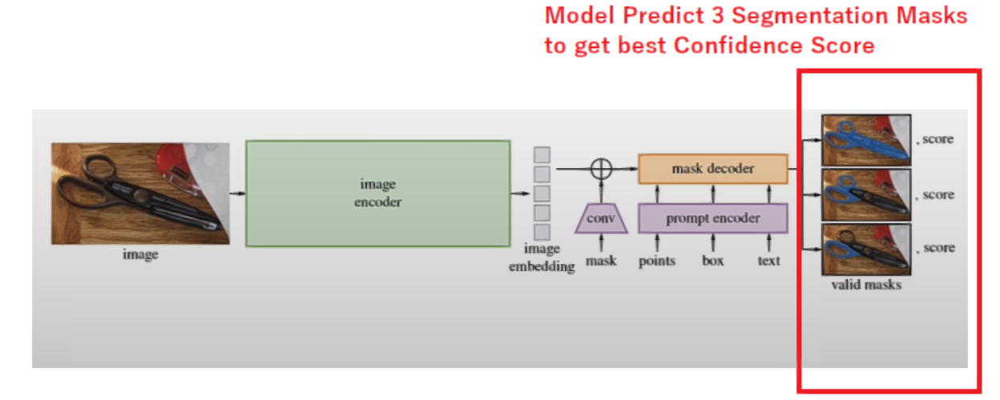


In [26]:
print(f"confidence Scores: {outputs.iou_scores}")

confidence Scores: tensor([[[0.9273, 0.8824, 0.9644]]])


In [27]:
from helper import show_mask_on_image

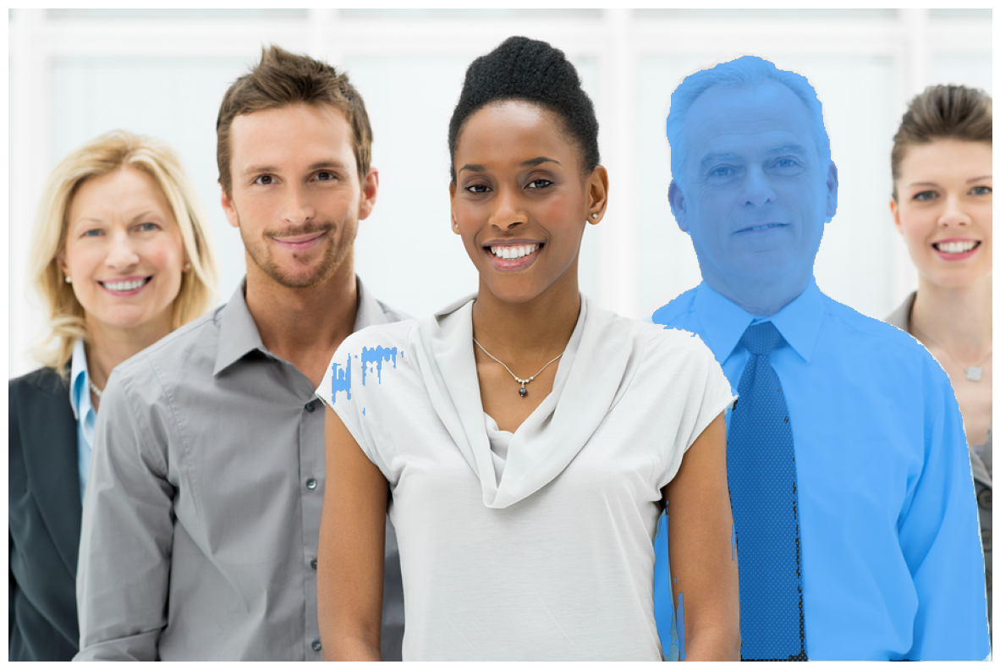

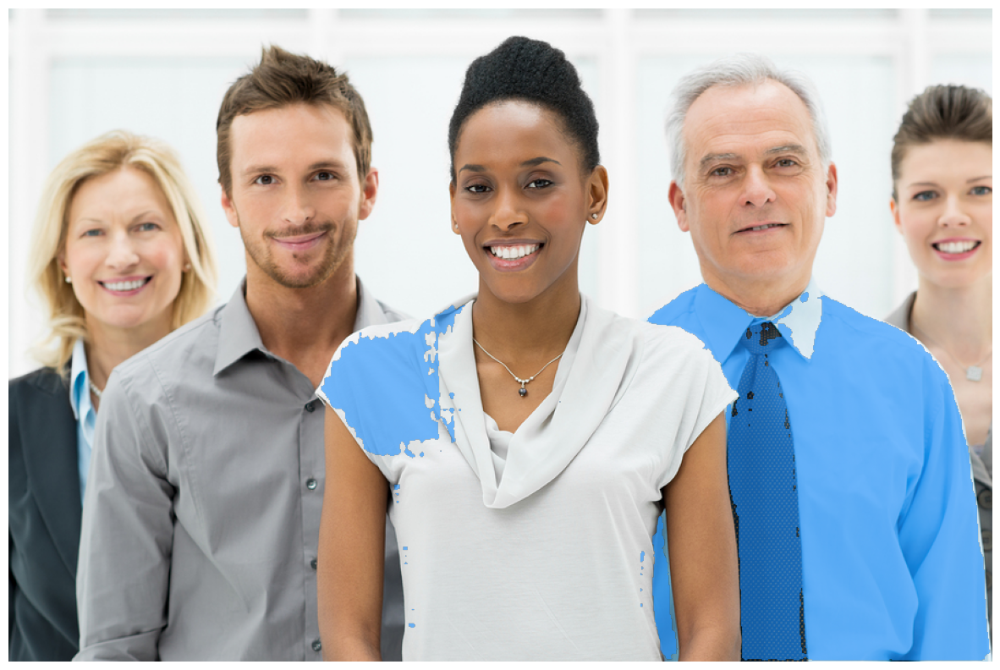

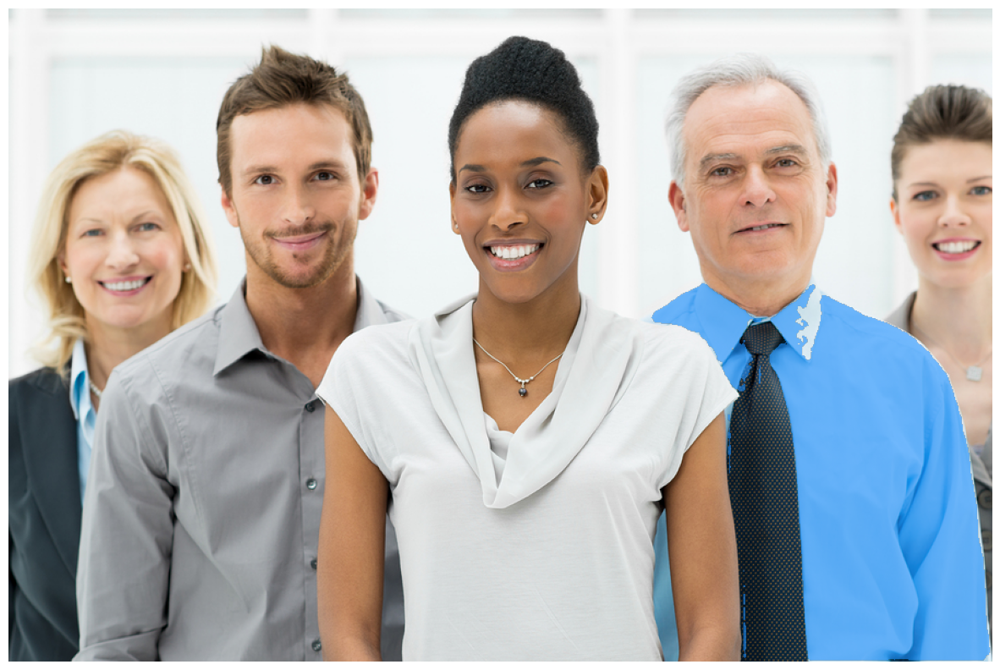

In [28]:
for i in range(3):
    show_mask_on_image(raw_image, predicted_mask[:, i])

# DPT(Dense Pretrained Transformer)

DPT (Dense Pretrained Transformer) enhances dense prediction tasks using Vision Transformer (ViT) as its backbone. It provides finer-grained predictions compared to fully-convolutional networks, yielding substantial improvements in performance, especially with large training data. DPT achieves state-of-the-art results in tasks like monocular depth estimation and semantic segmentation on datasets like ADE20K, NYUv2, KITTI, and Pascal Context.


👉 model: https://huggingface.co/docs/transformers/model_doc/dpt

👉 model in Github: https://github.com/isl-org/DPT

👉 research paper of model : https://arxiv.org/abs/2103.13413

##### Intel/dpt-hybrid-midas: 

DPT-Hybrid, also known as MiDaS 3.0, is a monocular depth estimation model based on the Dense Prediction Transformer (DPT) architecture, utilizing a Vision Transformer (ViT) backbone with additional components for enhanced performance. Trained on 1.4 million images, it offers accurate depth predictions for various applications such as autonomous navigation, augmented reality, and robotics, providing crucial depth perception for tasks like obstacle avoidance, scene understanding, and 3D reconstruction.


👉 model: https://huggingface.co/Intel/dpt-hybrid-midas

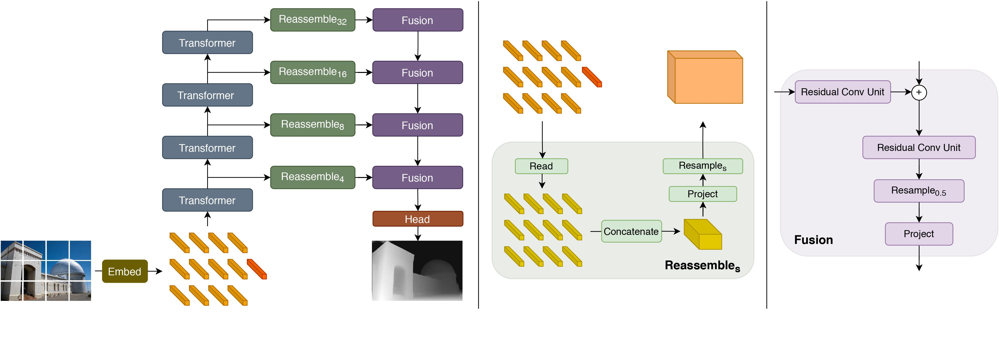

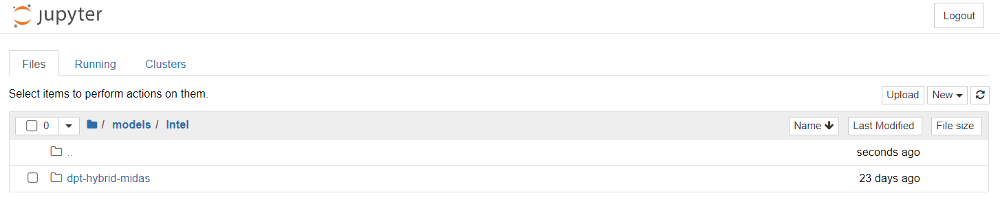

In [29]:
from transformers import pipeline

In [30]:
depth_estimator = pipeline(task = "depth-estimation", 
                          model = "./models/Intel/dpt-hybrid-midas")

In [31]:
print(f"model pipeline of depth_estimator {depth_estimator} in memory address.")

model pipeline of depth_estimator <transformers.pipelines.depth_estimation.DepthEstimationPipeline object at 0x7f364d5ca0d0> in memory address.


In [32]:
#Display image
from PIL import Image

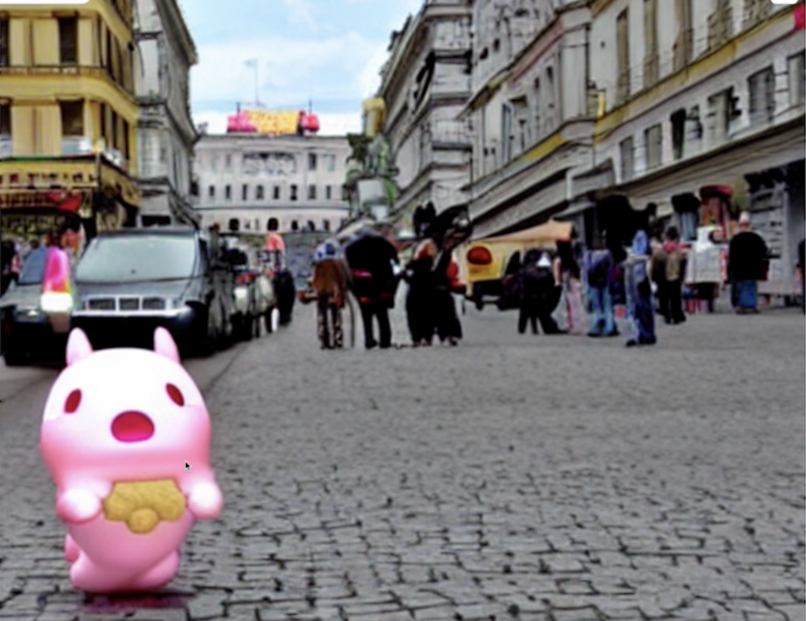

In [33]:
raw_image = Image.open("gradio_tamagochi_vienna.png")
raw_image.resize((806,621))

**📌 note:** The double parentheses, like in resize((806,621)), are used to create a tuple with two elements: the width (806) and height (621) of the desired image size. This syntax is common when passing multiple arguments to a function or method in Python

In [34]:
output = depth_estimator(raw_image)
print(f"output: \n {output}")

output: 
 {'predicted_depth': tensor([[[ 248.4071,  252.1830,  256.9172,  ...,  595.8305,  591.8116,
           471.2303],
         [ 247.3372,  254.8538,  257.9681,  ...,  596.0256,  589.0461,
           594.1448],
         [ 259.7676,  259.5482,  261.4168,  ...,  597.6295,  595.3380,
           595.7502],
         ...,
         [3014.1089, 3018.4841, 3019.1711,  ..., 3275.2764, 3269.3469,
          3268.8364],
         [3041.5540, 3040.2783, 3044.4622,  ..., 3280.7478, 3289.3660,
          3274.8696],
         [3039.7480, 3056.0347, 3052.9739,  ..., 3301.9995, 3298.1880,
          3286.9133]]]), 'depth': <PIL.Image.Image image mode=L size=1612x1242 at 0x7F364DB1EFD0>}


In [35]:
output['predicted_depth'].shape

torch.Size([1, 384, 384])

In [36]:
# to increase diamension
output['predicted_depth'].unsqueeze(1).shape

torch.Size([1, 1, 384, 384])

In [37]:
#import torch
import torch
prediction = torch.nn.functional.interpolate(
    output['predicted_depth'].unsqueeze(1),
    size=raw_image.size[::-1],
    mode = "bicubic",
    align_corners = False,
    )

In [38]:
print(f"details of prediction: \n{prediction}")

details of prediction: 
tensor([[[[ 248.1578,  248.2615,  248.7577,  ...,  468.0634,  447.0041,
            442.8558],
          [ 248.0310,  248.1445,  248.6919,  ...,  477.7621,  458.3935,
            454.5775],
          [ 247.0837,  247.2387,  247.9994,  ...,  508.8539,  494.9505,
            492.2087],
          ...,
          [3040.0376, 3040.3977, 3042.2314,  ..., 3285.1282, 3283.1465,
           3282.7571],
          [3037.8701, 3038.3862, 3041.0276,  ..., 3288.0645, 3286.3359,
           3285.9915],
          [3037.5503, 3038.1130, 3040.9944,  ..., 3289.0696, 3287.3906,
           3287.0552]]]])


### Normalize the predicted tensors (between 0 and 255) so that they can be displayed

In [39]:
import numpy as np

output = prediction.squeeze().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")

print(f"apply (0-255) conversion : \n\n {formatted}")

apply (0-255) conversion : 

 [[ 18  18  19 ...  35  34  33]
 [ 18  18  18 ...  36  35  34]
 [ 18  18  18 ...  38  37  37]
 ...
 [232 232 232 ... 250 250 250]
 [232 232 232 ... 251 251 250]
 [232 232 232 ... 251 251 251]]


In [41]:
depth = Image.fromarray(formatted)
print(f"depth: {depth}")

depth: <PIL.Image.Image image mode=L size=1612x1242 at 0x7F364D5CA5E0>


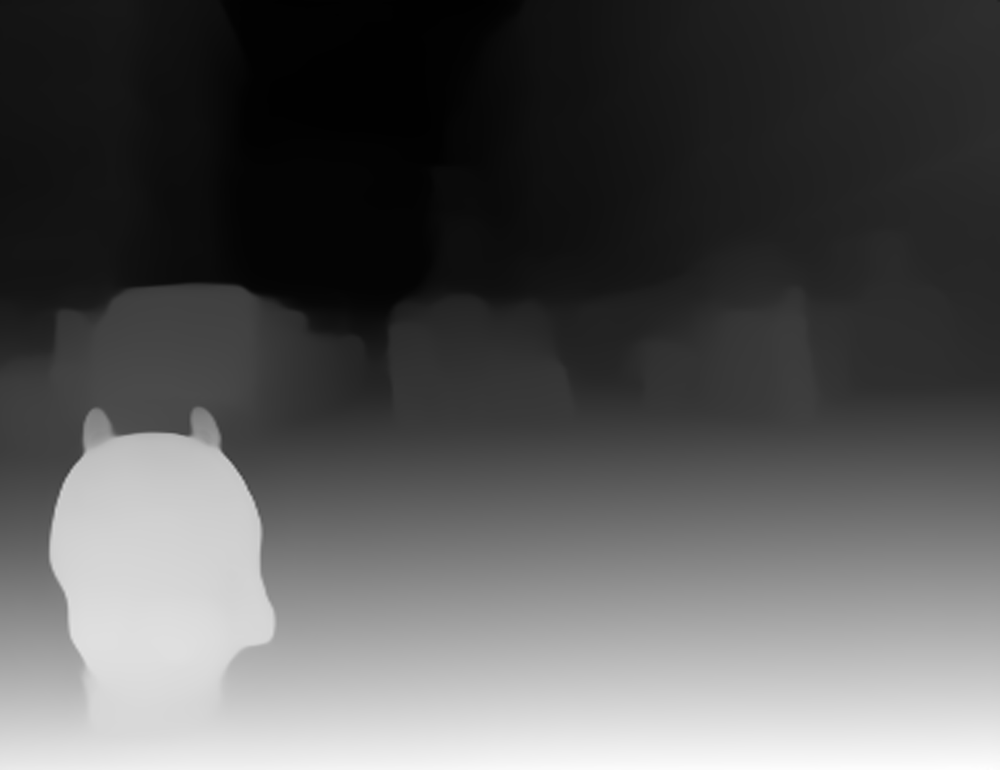

In [42]:
depth

# Demo with Garido

In [43]:
def launch(input_image):
    out = depth_estimator(input_image)

    # resize the prediction
    prediction = torch.nn.functional.interpolate(
        out["predicted_depth"].unsqueeze(1),
        size=input_image.size[::-1],
        mode="bicubic",
        align_corners=False,
    )

    # normalize the prediction
    output = prediction.squeeze().numpy()
    formatted = (output * 255 / np.max(output)).astype("uint8")
    depth = Image.fromarray(formatted)
    return depth

In [44]:
import os
import gradio as gr
from transformers import pipeline

In [45]:
iface = gr.Interface(launch, 
                     inputs=gr.Image(type='pil'), 
                     outputs=gr.Image(type='pil'))

In [46]:
iface.launch(share=True, server_port=int(os.environ['PORT1']))

Running on local URL:  https://0.0.0.0:50343
Running on public URL: https://269174df8b1bde09b1.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


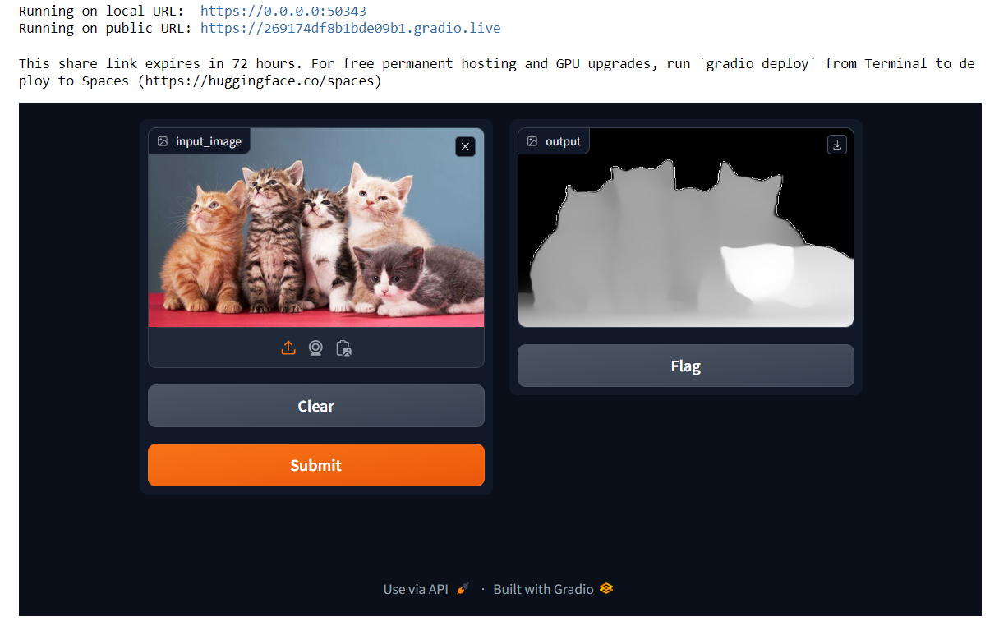

In [47]:
iface.close()

Closing server running on port: 50343
